In [11]:
import sys
sys.path.append("../")

In [3]:
import graspologic as gr
from graspologic import layouts
import numpy as np
import pandas as pd
import networkx as nx
from graph import GraphIO

Load the connectome to visualize

In [4]:
path = '../json_connectomes/ciona.json'
graph, _, _, _ = GraphIO.load(path)

Lets try a graspologic layout

In [5]:
graph, layout = gr.layouts.layout_tsne(graph, perplexity=20, n_iter=1000000)

In [6]:
color_map = {}
side_map = {'L': '#FF0000', 'DL': '#B22222', 'VL': '#F08080',
            'R': '#0000FF', 'DR': '#00008B', 'VR': '#87CEEB',
            'DM': '#800080', 'D': '#800080', 'VM': '#BA55D3',
            None: '#A9A9A9'}

for node in graph.nodes(data=True):
    try:
        side = node[1]['Side'].strip()
    except KeyError:
        side = None
    color_map[node[0]] = side_map[side]

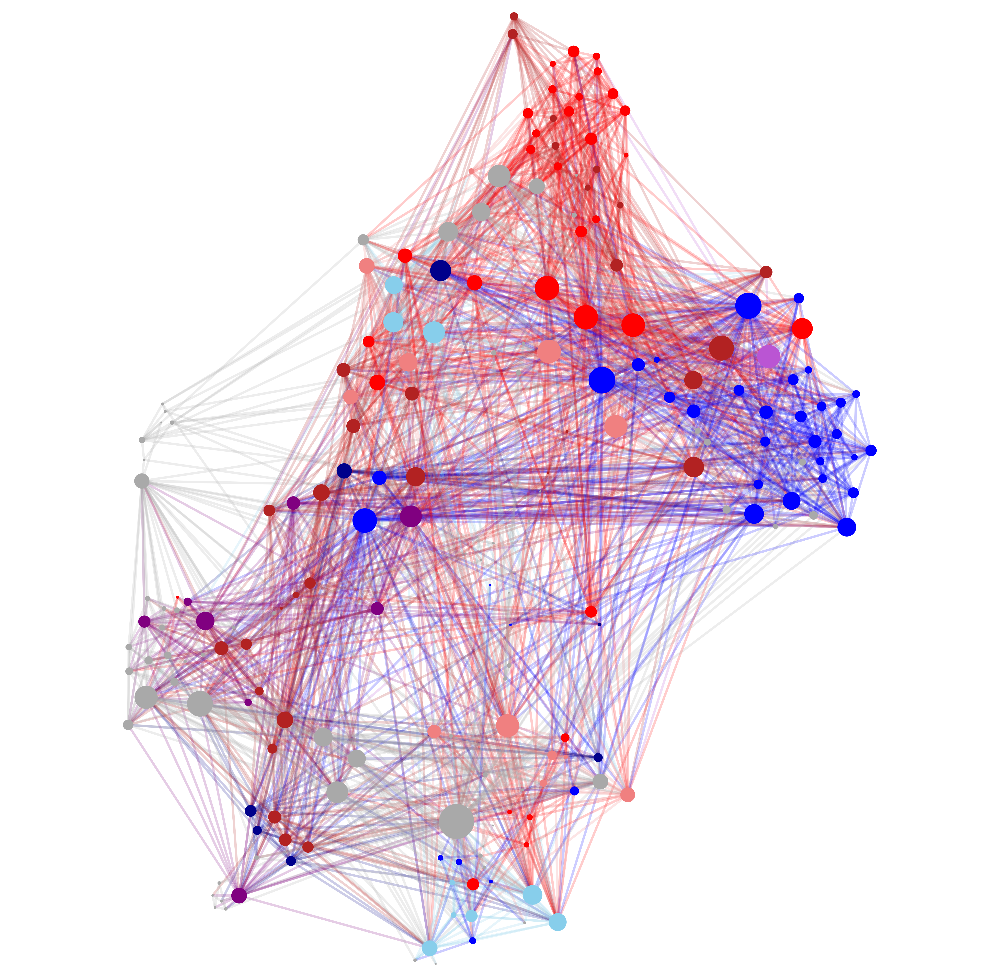

In [10]:
gr.layouts.show_graph(graph, layout, color_map, vertex_shape='.', vertex_alpha=1., edge_alpha=.2, edge_line_width=2.)

This seems to work ok, here the colors are based on side.

Get basic stats


In [8]:
import pandas as pd
num_nodes = len(graph.nodes)
num_edges = len(graph.edges)
density = num_edges / (num_nodes * (num_nodes - 1))
max_degree = max(graph.degree, key=lambda x: x[1])[1]
data = {'Number of Nodes': [num_nodes],
        'Number of Edges': [num_edges],
        'Density': [density],
        'Max Degree': [max_degree]}
df = pd.DataFrame.from_dict(data)
df.index = ['Ciona Intestinalis Connectome']
df.head()

,Number of Nodes,Number of Edges,Density,Max Degree
Ciona Intestinalis Connectome,222,2289,0.046655,78


In [9]:
adj, node_atts, edge_atts = GraphIO.get_adjacency_representation(graph)


KeyError: '1'